# Analysis on Chinese Restaurant in Toronto

This notebook is used to analyze the situation of Chinese restaurants in Toronto and help stakeholders who are planning to open new Chineses restaurants in Toronto. The analysis will include the following parts:

* [City Neighbourhoods and Demographics](#Part_1)
* [Venues in City of Toronto](#Part_2)
    + [Venues near one neighbourhood](#Part_2_1)
    + [Get venues in all neighbourhoods in Toronto and clean the data](#Part_2_2)
* [Types of neighbourhoods](#Part_3)
    + [Most categories of venues in the neighbourhoods](#Part_3_1)
    + [Similarity between neighbourhoods: Clustering](#Part_3_2)

written by Harry Li

P.S. Although the analysis in this notebook is focusing on Chinese restaurants, the methodology and codes can be used for assessing the situation of other types of restaurants or even coffee shops, and some findings including the city's population density may be significant for other bussinesses as well.

### Import Useful Libraries

In [1]:
import os
import numpy as np
import lxml
import pandas as pd
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json
from datetime import date
import datetime
import requests 


import descartes
import geopandas as gpd          # geopandas package is used to plot geographic map from geojson

# import Point and Polygon from shapely library to deal with neighbourhoods' shapes 
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon

import matplotlib.pyplot as plt
import matplotlib.cm as cm
%matplotlib inline
import seaborn as sns
sns.set_theme(style="darkgrid")

import folium          # folium package is used to plot interactive geographic map
from folium.plugins import Search
import branca

# import k-means from clustering stage
from sklearn.cluster import KMeans


## Part 1: City Neighbourhoods and Demographics <a id='Part_1'></a>

Firstly, let's take a look at the 140 neighbourhoods in Toronto. The neighbourhood profiles can be downloaded from Toronto open Data (https://open.toronto.ca/dataset/neighbourhoods/). 
The neighbourhood profiles is saved in .geojson file, which can be loaded into geopandas dataframe.

In [2]:
# read the boundarys of city neighbourhoods from geojson file
toronto_neighbours = gpd.read_file('./data/Neighbourhoods.geojson')

Let's take a look at what the geopandas dataframe looks like.

In [3]:
toronto_neighbours

,_id,AREA_ID,AREA_ATTR_ID,PARENT_AREA_ID,AREA_SHORT_CODE,AREA_LONG_CODE,AREA_NAME,AREA_DESC,X,Y,LONGITUDE,LATITUDE,OBJECTID,Shape__Area,Shape__Length,geometry
0,7281,25886861,25926662,49885,94,94,Wychwood (94),Wychwood (94),None,None,-79.425515,43.676919,16491505,3.217960e+06,7515.779658,"POLYGON ((-79.43592 43.68015, -79.43492 43.680..."
1,7282,25886820,25926663,49885,100,100,Yonge-Eglinton (100),Yonge-Eglinton (100),None,None,-79.403590,43.704689,16491521,3.160334e+06,7872.021074,"POLYGON ((-79.41096 43.70408, -79.40962 43.704..."
2,7283,25886834,25926664,49885,97,97,Yonge-St.Clair (97),Yonge-St.Clair (97),None,None,-79.397871,43.687859,16491537,2.222464e+06,8130.411276,"POLYGON ((-79.39119 43.68108, -79.39141 43.680..."
3,7284,25886593,25926665,49885,27,27,York University Heights (27),York University Heights (27),None,None,-79.488883,43.765736,16491553,2.541821e+07,25632.335242,"POLYGON ((-79.50529 43.75987, -79.50488 43.759..."
4,7285,25886688,25926666,49885,31,31,Yorkdale-Glen Park (31),Yorkdale-Glen Park (31),None,None,-79.457108,43.714672,16491569,1.156669e+07,13953.408098,"POLYGON ((-79.43969 43.70561, -79.44011 43.705..."
5,7286,25886404,25926667,49885,114,114,Lambton Baby Point (114),Lambton Baby Point (114),None,None,-79.496045,43.657420,16491585,3.406857e+06,11181.788316,"POLYGON ((-79.50552 43.66281, -79.50577 43.662..."
6,7287,25886627,25926668,49885,38,38,Lansing-Westgate (38),Lansing-Westgate (38),None,None,-79.424748,43.754271,16491601,1.025436e+07,15391.584157,"POLYGON ((-79.43998 43.76156, -79.44004 43.761..."
7,7288,25886808,25926669,49885,105,105,Lawrence Park North (105),Lawrence Park North (105),None,None,-79.403978,43.730060,16491617,4.388577e+06,9051.488042,"POLYGON ((-79.39008 43.72768, -79.39199 43.727..."
8,7289,25886812,25926670,49885,103,103,Lawrence Park South (103),Lawrence Park South (103),None,None,-79.406039,43.717212,16491633,6.211341e+06,13530.370002,"POLYGON ((-79.41096 43.70408, -79.41165 43.703..."
9,7290,25886328,25926671,49885,56,56,Leaside-Bennington (56),Leaside-Bennington (56),None,None,-79.366072,43.703797,16491649,9.161864e+06,20531.730658,"POLYGON ((-79.37749 43.71309, -79.37762 43.713..."


Wow, there are lots of columns in the geopandas dataframe! It looks pretty like the pandas dataframe, but stores some geographic information. Basically, each row in the dataframe represents for one neibourhood in Toronto. And we can find the id, name and geographic information of each neighourhood from the columns of 'AREA_SHORT_CODE', 'AREA_NAME', 'LATITUDE' and 'LONGITUDE'. It should be noted that the iregular shape of each neighbourhood is represented as a polygon or multipolygon in geometry column. 

Then we can plot the boundaries of the neighbourhood in City of Toronto.

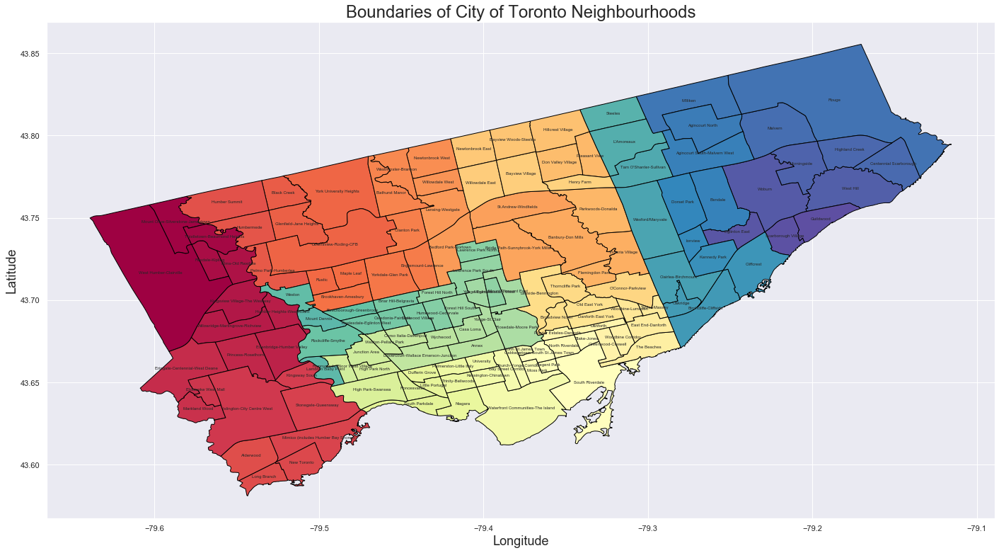

In [4]:
# plot the boundaries of neighbourhoods in City of Toronto
toronto_neighbours.plot(figsize=(24,30), column='AREA_LONG_CODE',cmap='Spectral', edgecolor='black')
plt.title('Boundaries of City of Toronto Neighbourhoods', fontsize=24)
plt.xlabel('Longitude', fontsize=18)
plt.ylabel('Latitude', fontsize=18)

for idx, row in toronto_neighbours.iterrows():
    neighbourhood = " ".join(row['AREA_NAME'].split()[:-1])
    plt.annotate(s=neighbourhood, horizontalalignment='center', xy=(row['LONGITUDE'],row['LATITUDE']),fontsize=6)

plt.savefig('./output/boundaries_of_Toronto_neighbourhoods.pdf')
plt.savefig('./output/boundaries_of_Toronto_neighbourhoods.png', dpi=300, bbox_inches='tight')

We can also plot the boundaries of neighbourhoods on an interactive open stree map using Folium, where you can see the surrounding open street and search for a specific neighbourhood.

In [5]:
# choose a linear colormap (Spectral_07) from branca
colormap = branca.colormap.linear.Spectral_07.scale(1,140)
colormap.caption = 'IDs of neighbourhoods'

# define a style function to apply the customed colormap in folium
style_function = lambda x: {
    'fillColor': colormap(x['properties']['AREA_SHORT_CODE']),
    'color': 'white',
    'weight': 0.5,
    'fillOpacity':0.7
}

# Create the open street map from Folium
center_location = [toronto_neighbours['LATITUDE'].mean(), toronto_neighbours['LONGITUDE'].mean()]
open_street_map = folium.Map(name='GTA regions', location=center_location, zoom_start=10, width='100%', height='100%')

# Create a GeoJson layer of the Toronto neighbourhoods to be added to the open street map
toronto_neighbours_layer = folium.GeoJson(
    toronto_neighbours,
    name='Toronto neighborhoods',
    style_function=style_function
).add_to(open_street_map)

# Add the name and id of each neighbourhood
for lat, lon, name in zip(toronto_neighbours['LATITUDE'],toronto_neighbours['LONGITUDE'],toronto_neighbours['AREA_NAME']):
    folium.Circle(location=[lat,lon],
                  radius=30,
                  fill=False,
                  color='black',
                  tooltip=name,
                  ).add_to(open_street_map)

# We can also add a search box for neighbourhoods
statesearch = Search(
    layer=toronto_neighbours_layer,
    geom_type='Polygon',
    placeholder='Search for a Toronto neighbourhood',
    collapsed=False,
    search_label='AREA_NAME',
    weight=3
).add_to(open_street_map)

folium.LayerControl().add_to(open_street_map)
open_street_map.add_child(colormap)                 # Add the colormap on the street map


open_street_map.save('./output/boundaries_of_Toronto_neighbourhoods.html')
open_street_map

/Users/harryliyi/opt/anaconda3/envs/py37/lib/python3.7/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


### Demographics of City of Toronto

In order to do a success bussniss, we need to investigate some basic situation of the city. We want to open the restaurant at the place where more people will come, so we can take a look at the population density of the city. THe demographics data are accquried from Toronto Open Data (https://open.toronto.ca/dataset/wellbeing-toronto-demographics/). 

In [6]:
# read the demographics in 2016
toronto_demographics = pd.read_excel('./data/wellbeing-toronto-population-total-2011-2016-and-age-groups-2016.xlsx', sheet_name=1, header=0)

# check what's in the file
toronto_demographics.head()

,HoodID,Neighbourhood,Pop2016,Pop2011,PopChg11t16
0,1,West Humber-Clairville,33312,34100,-0.023109
1,2,Mount Olive-Silverstone-Jamestown,32954,32788,0.005063
2,3,Thistletown-Beaumond Heights,10360,10138,0.021898
3,4,Rexdale-Kipling,10529,10488,0.003909
4,5,Elms-Old Rexdale,9456,9550,-0.009843


Unfortunately, we can only access the population data in 2016 and 2011. Let's use the newest data we have and plot the demographics on the street map.

In [7]:
# Create the open street map from Folium
center_location = [toronto_neighbours['LATITUDE'].mean(), toronto_neighbours['LONGITUDE'].mean()]
open_street_map = folium.Map(name='GTA regions', location=center_location, zoom_start=10, width='100%', height='100%')

# rename the HoodID to AREA_SHORT_CODE for plot
toronto_demographics.rename(columns={'HoodID':'AREA_SHORT_CODE'}, inplace=True)

# Create a GeoJson layer of the Toronto neighbourhoods to be added to the open street map
toronto_neighbours_layer = folium.Choropleth(
    geo_data=toronto_neighbours,
    name='Toronto Demographics in 2016',
    data=toronto_demographics,
    columns=['AREA_SHORT_CODE', 'Pop2016'],
    key_on='feature.properties.AREA_SHORT_CODE',
    fill_color='BuPu',
    fill_opacity=0.7,
    line_color='white',
    line_opacity=0.5,
    legend_name='Population Density'
).add_to(open_street_map)

# Add the name and id of each neighbourhood
for lat, lon, name,code in zip(toronto_neighbours['LATITUDE'],toronto_neighbours['LONGITUDE'],toronto_neighbours['AREA_NAME'], toronto_neighbours['AREA_SHORT_CODE']):
    folium.Circle(location=[lat,lon],
                  radius=30,
                  fill=False,
                  color='black',
                  tooltip=name+'\n'+'Pop: '+str(toronto_demographics.loc[code-1,'Pop2016']),
                  ).add_to(open_street_map)

folium.LayerControl().add_to(open_street_map)

open_street_map

/Users/harryliyi/opt/anaconda3/envs/py37/lib/python3.7/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


Apparently, the population distribution is not homogeneous. Let's take a look at top 20 neighbourhoods.

In [8]:
toronto_demographics.sort_values(by='Pop2016', ascending=False).head(20)

,AREA_SHORT_CODE,Neighbourhood,Pop2016,Pop2011,PopChg11t16
76,77,Waterfront Communities-The Island,65913,43361,0.520099
136,137,Woburn,53485,53350,0.002530
50,51,Willowdale East,50434,45041,0.119735
130,131,Rouge,46496,45912,0.012720
116,117,L'Amoreaux,43993,44919,-0.020615
13,14,Islington-City Centre West,43965,38084,0.154422
131,132,Malvern,43794,45086,-0.028656
92,93,Dovercourt-Wallace Emerson-Junction,36625,34631,0.057578
25,26,Downsview-Roding-CFB,35052,34659,0.011339
44,45,Parkwoods-Donalda,34805,34617,0.005431


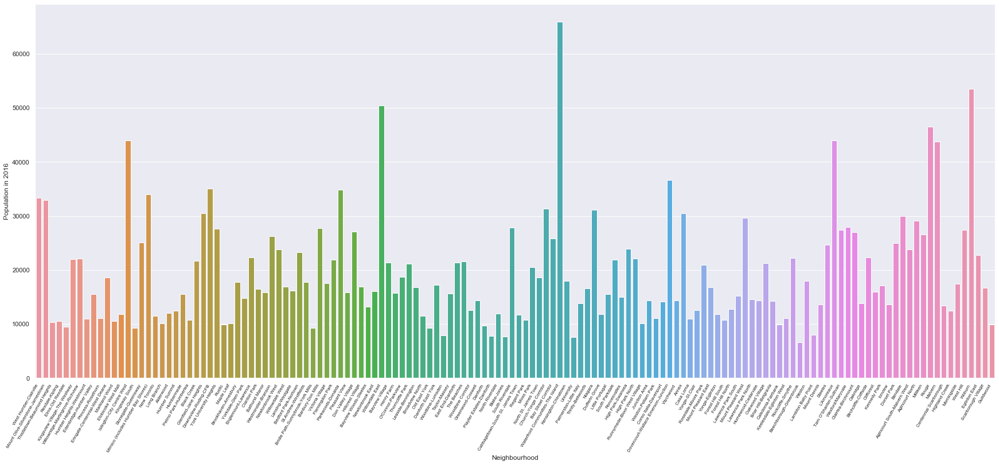

In [9]:
fig = plt.figure(figsize=(30,12)) 
ax = sns.barplot(x="Neighbourhood", y='Pop2016', data=toronto_demographics)
ax.set_ylabel('Population in 2016')
ax.set_xticklabels(ax.get_xticklabels(), rotation=60, ha="right", fontsize=8)
plt.savefig('./output/Toronto_population_2016.png',dpi=200,bbox_inches='tight')

From the barplot, we can find the neighbourhood that has largest population is Waterfront Communities with a population of 65913 in 2016, and the following top 4 nieghbourhoods are Woburn, Willowdale East, Rouge and L'Amoreaux.

## Part 2: Venues in City of Toronto <a id='Part_2'></a>

Secondly, let's investigate the venues in the neighbourhoods in Toronto. Basically, in this part, we want to know if there is any difference in the types of venues among various neighbourhoods. Some neighbourhoods might consist of factories and can be recongnized as industry regions, whereas some neighbourhoods might have lots of cinemas, bars, restaurants and can be considered as entertainment regions. We definitely want to open a restaurant in entertainment regions instead of industry regions. We can use K-means method to cluster the neighbourhoods with similar  types of venues and assess defference among clusters.

#### Loading personal credential for Foursquare API

In [10]:
# set up date for the version
today = date.today()

# read Foursquare confidentials from json file

with open('../Foursquare_credentials.json') as file:
    foursquare_id = json.load(file)
    CLIENT_ID = foursquare_id['CLIENT_ID']
    CLIENT_SECRET = foursquare_id['CLIENT_SECRET']
    VERSION = today.strftime("%Y%m%d")

### 2.1 Venues in a specific neighbourhood in Toronto <a id='Part_2_1'></a>

Before requesting the venue information for all neighboruhoods, let's try to investigate a specific neighbourhood in Toronto, Waterfront Communities. This neighbourhood has the largest population and close the Ontario Lake. It is one of the famous entertainment districts in Toronto. We can take a look at the venues information in this region by accquring the data within this neighbourhood from Foursquare.

It should be noted that the geographic shape of each neighbourhood in Toronto is described as a polygon in Geojson. In order to request the data within this region, we can pass a polygon parameter to the venues/explore endpoint (https://developer.foursquare.com/docs/sdk-reference/geofences-api/add-polygon/). But the polygon cannot be too complex, as the polygon parameter in Foursuqare endpoint only allows between 4 and 15 points in a clockwise fashion and Foursquare will only return up to 100 results.

So, in order to get all venues in the neighbourhood, we need to create a mesh grid that covers the the specific shape of the neighbourhood, and make sure the grid size is smaller enough so that each grid will contains less than 100 venues. To implement this, we can calculate the maximum and minimum values of lats/lons of the neighbourhood and evenly split the range of lats/lons to create the rectangle mesh grid.

After retreiving the data from Foursquare, we can then easily exclude the venues that are outside of the neighbourhood using the location of venues.

In [11]:
# select the polygon of Waterfront Communities
polygon = toronto_neighbours.loc[61,'geometry']

# get the lat/lon of the center of this neighbourhood
neighbourhood_lat = toronto_neighbours.loc[61,'LATITUDE']
neighbourhood_lon = toronto_neighbours.loc[61,'LONGITUDE']

print(neighbourhood_lat)
print(neighbourhood_lon)

# extract the lat/lon of each point of the polygon
lons, lats = polygon.exterior.coords.xy

# get the max/min of lons/lats
lat_min = np.amin(np.array(lats))
lat_max = np.amax(np.array(lats))
lon_min = np.amin(np.array(lons))
lon_max = np.amax(np.array(lons))

# split the ranges between max/min of lats and lons, we can choose the increment of 0.005 (0.005 deg is roughly 500m)
lats_mesh = np.arange(lat_min, lat_max+0.005, 0.005)
lons_mesh = np.arange(lon_min, lon_max+0.005, 0.005)

# create a list to store strings that contain rectangle mesh grids
# The format of polygon string is lat%2Clon%3Blat%2Clon... 
polygonstr = []

for i in range(len(lats_mesh)-1):
    for j in range(len(lons_mesh)-1):
        lat_min = str(lats_mesh[i])
        lat_max = str(lats_mesh[i+1])
        lon_min = str(lons_mesh[j])
        lon_max = str(lons_mesh[j+1])
        
        tempstr = lat_min+'%2C'+lon_min+'%3B'+lat_max+'%2C'+lon_min+'%3B'+lat_max+'%2C'+lon_max+'%3B'+lat_min+'%2C'+lon_max+'%3B'+lat_min+'%2C'+lon_min     
        polygonstr.append(tempstr)
        
# polygonstr   # let's take a look at what the string look like
print(polygonstr[0])
print(len(polygonstr))

43.6338803623
-79.3772023146
43.6119544146158%2C-79.4048993790719%3B43.616954414615805%2C-79.4048993790719%3B43.616954414615805%2C-79.39989937907191%3B43.6119544146158%2C-79.39989937907191%3B43.6119544146158%2C-79.4048993790719
108


Define a function to get the category type for each revenue

In [12]:
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

Get the results of venues in each mesh grid from Foursquare and then use the above function to clean data.

In [13]:
# Set up parameter and url for request
LIMIT = 300      # set the maximum number of result to 300

# create a new datafram to store venues
df = pd.DataFrame(columns=['id', 'name', 'categories', 'lat', 'lng'])

# Loop over all meshs
for polystr in polygonstr:
#     print(polystr)
    url='https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&polygon={}&v={}&limit={}'.format(CLIENT_ID,CLIENT_SECRET,polystr,VERSION,LIMIT)
    
    # Retrieve the results from Foursquare.
    results = requests.get(url).json()
    venues = results['response']['groups'][0]['items']
    
    # if there are venues in selected mesh
    if venues:
        # flatten JSON
        nearby_venues = json_normalize(venues)
    
        # filter columns
        filtered_columns = ['venue.id','venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
        nearby_venues = nearby_venues.loc[:, filtered_columns]
        # filter the category for each row
        nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)
    
        # clean columns
#         nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]
        nearby_venues.columns = ['id', 'name', 'categories', 'lat', 'lng']
        print('{} venues were found in the grid.'.format(nearby_venues.shape[0]))
        
        # append the data
        df = df.append(nearby_venues, ignore_index=True)
    

# drop duplicated venues
df.drop_duplicates(inplace=True)

# number of venues that are returned by Foursquare
print('{} venues were returned by Foursquare.'.format(df.shape[0]))

# print first 5 rows
df.head()
    

/Users/harryliyi/opt/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:19: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead


3 venues were found in the grid.
3 venues were found in the grid.
1 venues were found in the grid.
4 venues were found in the grid.
4 venues were found in the grid.
2 venues were found in the grid.
3 venues were found in the grid.
8 venues were found in the grid.
1 venues were found in the grid.
2 venues were found in the grid.
5 venues were found in the grid.
6 venues were found in the grid.
1 venues were found in the grid.
3 venues were found in the grid.
3 venues were found in the grid.
2 venues were found in the grid.
10 venues were found in the grid.
4 venues were found in the grid.
3 venues were found in the grid.
4 venues were found in the grid.
5 venues were found in the grid.
2 venues were found in the grid.
1 venues were found in the grid.
8 venues were found in the grid.
9 venues were found in the grid.
1 venues were found in the grid.
3 venues were found in the grid.
2 venues were found in the grid.
2 venues were found in the grid.
1 venues were found in the grid.
4 venues 

,id,name,categories,lat,lng
0,4bb6320246d4a5936fd7c5c0,Hanlan's Point Beach,Nudist Beach,43.616790,-79.391930
1,4c659ebbe75ac928744af5da,Cottage Life boat,Boat or Ferry,43.616551,-79.390761
2,5ab9ce5b6bd36b71fd066659,Fabio's Menswear,Clothing Store,43.612217,-79.392700
3,4c4e215dfb742d7fcbf5cf2d,Gibraltar Point Lighthouse,Lighthouse,43.613613,-79.385192
4,52036ed7498ebe0f1cbd7817,Chelsea Beach,Beach,43.616846,-79.385027


Check if returned venues are in this region and exclude the venues that are outside of the neighbourhood using the location of venues.

In [14]:
isinregion = []

for lat, lon in zip(df['lat'],df['lng']):
    point = Point(lon, lat)
    isinregion.append(polygon.contains(point))  # check if the point is in the polygon

df['within region']=isinregion

# drop the venues that are out of the neighbourhood
df.drop(df[df['within region']==False].index, axis=0, inplace=True)

print('Counts for all venues in Waterfront Communities:')
df.count()

Counts for all venues in Waterfront Communities:


id               582
name             582
categories       582
lat              582
lng              582
within region    582
dtype: int64

Let's plot all venues on open street map.

In [15]:
# choose a linear colormap (Spectral_07) from branca
colormap = branca.colormap.linear.Spectral_07.scale(1,140)
colormap.caption = 'IDs of neighbourhoods'

# define a style function to apply the customed colormap in folium
style_function = lambda x: {
    'fillColor': colormap(x['properties']['AREA_SHORT_CODE']),
    'color': 'black',
    'weight': 1,
    'fillOpacity':0.7
}

# Create the open street map from Folium
center_location = [neighbourhood_lat, neighbourhood_lon]
open_street_map = folium.Map(name='GTA regions', location=center_location, zoom_start=13, width='100%', height='100%')

# Create a GeoJson layer of the Toronto neighbourhoods to be added to the open street map
toronto_neighbours_layer = folium.GeoJson(
    toronto_neighbours,
    name='Toronto neighborhoods',
    style_function=style_function
).add_to(open_street_map)

# Add the name and id of each neighbourhood
for lat, lon, name in zip(toronto_neighbours['LATITUDE'],toronto_neighbours['LONGITUDE'],toronto_neighbours['AREA_NAME']):
    folium.Circle(location=[lat,lon],
                  radius=30,
                  fill=False,
                  color='black',
                  tooltip=name,
                  ).add_to(open_street_map)

# Add the name and id of each neighbourhood
for lat, lon, name, cate in zip(df['lat'],df['lng'],df['name'],df['categories']):
    folium.Marker(location=[lat,lon],
                  popup=name+'\n ---'+cate,
                  ).add_to(open_street_map)

folium.LayerControl().add_to(open_street_map)
open_street_map.add_child(colormap)                 # Add the colormap on the street map


open_street_map

/Users/harryliyi/opt/anaconda3/envs/py37/lib/python3.7/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


Okay, it looks good. We pulled all venues in the Waterfront Communities Neighbourhood, and get to know the category of each venue. Now we are able to pull all venues in City of Toronto and can move on to the next step to analyze the data. 

### 2.2 Get Venues in City of Toronto from Foursquare and Clean the Data <a id='Part_2_2'></a>

Similar as the previous step, we are going to pull out the venues in all neighbourhoods in Toronto from Foursquare. In order to do this, we can merge the procedures in the step into a function to deal with the venues in one neighbourhood and then loop over all neighourhoods in Toronto.

In [16]:
# Merge all procedures in the previous step into one function
def getVenues(neighbourhood_id, neighbourhood_name, neighbourhood_lat, neighbourhood_lon, neighbourhood_polygon, count):
    '''
    Input Parameter:
    neighbourhood_id: int, the ID of the neighourhood,
    neighbourhood_name: string, the name of the neighbourhood,
    neighbourhood_lat: float, the latitude of the neighbourhood,
    neighbourhood_lon: float, the longitude of the neighbourhood,
    neighbourhood_polygon: polygon, the geographic information of the shape of the neighbourhood
    
    Return:
    nearby_venues: Pandas DataFrame contains the venues in the neighbourhoods, the columns are
                   ID, name, latitude, longitude of the neighbourhood, and specific ids, names, 
                   latitudes, longitudes of the venues
    '''
    
    print('Start downloading venues in '+neighbourhood_name+'...')
    
    # extract the lat/lon of each point of the polygon
    lons, lats = neighbourhood_polygon.exterior.coords.xy
    
    # get the max/min of lons/lats
    lat_min = np.amin(np.array(lats))
    lat_max = np.amax(np.array(lats))
    lon_min = np.amin(np.array(lons))
    lon_max = np.amax(np.array(lons))
    
    # split the ranges between max/min of lats and lons, we can choose the increment of 0.005 (0.005 deg is roughly 500m)
    lats_mesh = np.arange(lat_min, lat_max+0.005, 0.005)
    lons_mesh = np.arange(lon_min, lon_max+0.005, 0.005)

    # create a list to store strings that contain rectangle mesh grids
    # The format of polygon string is lat%2Clon%3Blat%2Clon... 
    polygonstr = []

    for i in range(len(lats_mesh)-1):
        for j in range(len(lons_mesh)-1):
            lat_min = str(lats_mesh[i])
            lat_max = str(lats_mesh[i+1])
            lon_min = str(lons_mesh[j])
            lon_max = str(lons_mesh[j+1])
        
            tempstr = lat_min+'%2C'+lon_min+'%3B'+lat_max+'%2C'+lon_min+'%3B'+lat_max+'%2C'+lon_max+'%3B'+lat_min+'%2C'+lon_max+'%3B'+lat_min+'%2C'+lon_min     
            polygonstr.append(tempstr)
    
    totcount= count + len(polygonstr)
    
    venues_list=[]
    # Loop over all meshs
    for polystr in polygonstr:
        url='https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&polygon={}&v={}&limit={}'.format(
            CLIENT_ID,
            CLIENT_SECRET,
            polystr,
            VERSION,
            LIMIT)
        
        # Retrieve the results from Foursquare.
        results = requests.get(url).json()
#         print(results)
        venues = results['response']['groups'][0]['items']
    
        # if there are venues in selected mesh
        if venues:
            # return only relevant information for each nearby venue
            venues_list.append([(
                neighbourhood_id,
                neighbourhood_name, 
                neighbourhood_lat, 
                neighbourhood_lon, 
                v['venue']['id'],
                v['venue']['name'],
                v['venue']['categories'][0]['name'],
                v['venue']['location']['lat'], 
                v['venue']['location']['lng']) for v in venues])
        
        print('...', end='')

    # Convert the list to pandas dataframe
    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighbourhood ID', 
                'Neighbourhood Name', 
                'Neighbourhood Latitude', 
                'Neighbourhood Longitude', 
                'Venue ID', 
                'Venue Name', 
                'Venue Category',
                'Venue Latitude', 
                'Venue Longitude']
    
    # Count the number of returned venues
    print('{} venues were found in the mesh of {}.'.format(nearby_venues.shape[0], neighbourhood_name))   
    
    # drop duplicated venues
    nearby_venues.drop_duplicates(inplace=True)
    
    # Drop the venues that are outside of the neighbourhood
    isinregion = []
    
    for lat, lon in zip(nearby_venues['Venue Latitude'],nearby_venues['Venue Longitude']):
        point = Point(lon, lat)
        isinregion.append(neighbourhood_polygon.contains(point))  # check if the point is in the polygon
    
    nearby_venues['within region']=isinregion
    
    # drop the venues that are out of the neighbourhood
    nearby_venues.drop(nearby_venues[nearby_venues['within region']==False].index, axis=0, inplace=True)
    
    # Count the number of returned venues
    print('Current count is: '+str(totcount))
    print('{} venues were found in the neighbourhood: {}.'.format(nearby_venues.shape[0], neighbourhood_name))
    
    # return all venues in the neighbourhood
    return nearby_venues, totcount

Now We can then loop over all neighbourhoods and get all venues. But notice that this will cost a long time and Foursquare has a limit on API calls per day. So we'd better save the data locally after getting the data from Foursquare and check if local data exists to prevent duplicated API calls

In [17]:
# create a new datafram to store venues
toronto_venues = pd.DataFrame(columns=['Neighbourhood ID', 
                                        'Neighbourhood Name', 
                                        'Neighbourhood Latitude', 
                                        'Neighbourhood Longitude', 
                                        'Venue ID', 
                                        'Venue Name', 
                                        'Venue Category',
                                        'Venue Latitude', 
                                        'Venue Longitude'])

In [18]:
# Check if local data exists
indata = 'Venues_in_Toronto.csv'

if not os.path.isfile('./data/'+indata):
    
    # count for daily API calls
    count = 0

    for idx in range(toronto_neighbours.shape[0]):
        print('No. '+str(idx+1))
        neighbourhood_id = toronto_neighbours.loc[idx,'AREA_SHORT_CODE']
        neighbourhood_name =  " ".join(toronto_neighbours.loc[idx,'AREA_NAME'].split()[:-1]) 
    
        # select the polygon of Waterfront Communities
        neighbourhood_polygon = toronto_neighbours.loc[idx,'geometry']
    
        # get the lat/lon of the center of this neighbourhood
        neighbourhood_lat = toronto_neighbours.loc[idx,'LATITUDE']
        neighbourhood_lon = toronto_neighbours.loc[idx,'LONGITUDE']
        
        # Get venues in selected neighbourhood
        neighbourhood_venues, totcount = getVenues(neighbourhood_id, neighbourhood_name, neighbourhood_lat, neighbourhood_lon, neighbourhood_polygon, count)
        count = totcount
        
        # Append the venues in the neighbourhood
        toronto_venues = toronto_venues.append(neighbourhood_venues, ignore_index=True)
        
        if totcount>4300:
            print('It is going to exceed the hourly rate limit. Please hold on...')
            print()
            print('Current Index is '+str(idx))
            current_time = datetime.datetime.now().strftime("%Y/%m/%d  %H:%M:%S")
            print("Current Time =", current_time)
            break
    
    toronto_venues.reset_index(drop=True, inplace=True)
    toronto_venues.drop(columns=['within region'], inplace=True)
    toronto_venues.to_csv('./data/Venues_in_Toronto.csv',sep=',',index=False)

if os.path.isfile('./data/'+indata):
    toronto_venues = pd.read_csv('./data/'+indata, sep=',', header=0)

Let's check the data.

In [19]:
toronto_venues.head()

,Neighbourhood ID,Neighbourhood Name,Neighbourhood Latitude,Neighbourhood Longitude,Venue ID,Venue Name,Venue Category,Venue Latitude,Venue Longitude
0,94,Wychwood,43.676919,-79.425515,4b0df2fdf964a520095323e3,The Gem,Bar,43.674585,-79.431947
1,94,Wychwood,43.676919,-79.425515,4bacc7b0f964a520b60b3be3,Alcoa Bakery,Bakery,43.674663,-79.431347
2,94,Wychwood,43.676919,-79.425515,4cc89c8d5c17b60c6f4e0405,A Guy In A Store That Fixes Leather -Sandalman...,Other Repair Shop,43.674315,-79.433377
3,94,Wychwood,43.676919,-79.425515,4bae730cf964a520ddb33be3,Faema,Gourmet Shop,43.673809,-79.433341
4,94,Wychwood,43.676919,-79.425515,4b4ace20f964a5207b8e26e3,Salto Restaurant & Bar,Italian Restaurant,43.673786,-79.433276


Check how many venues were returned for each neighborhood.

In [20]:
toronto_venues.groupby('Neighbourhood Name').count().sort_values(by='Neighbourhood ID',axis=0, ascending=False)

,Neighbourhood ID,Neighbourhood Latitude,Neighbourhood Longitude,Venue ID,Venue Name,Venue Category,Venue Latitude,Venue Longitude
Neighbourhood Name,,,,,,,,
Waterfront Communities-The Island,582,582,582,582,582,582,582,582
Islington-City Centre West,346,346,346,346,346,346,346,346
West Humber-Clairville,303,303,303,303,303,303,303,303
Bay Street Corridor,284,284,284,284,284,284,284,284
South Riverdale,252,252,252,252,252,252,252,252
Annex,241,241,241,241,241,241,241,241
Kensington-Chinatown,207,207,207,207,207,207,207,207
Church-Yonge Corridor,201,201,201,201,201,201,201,201
Rouge,191,191,191,191,191,191,191,191


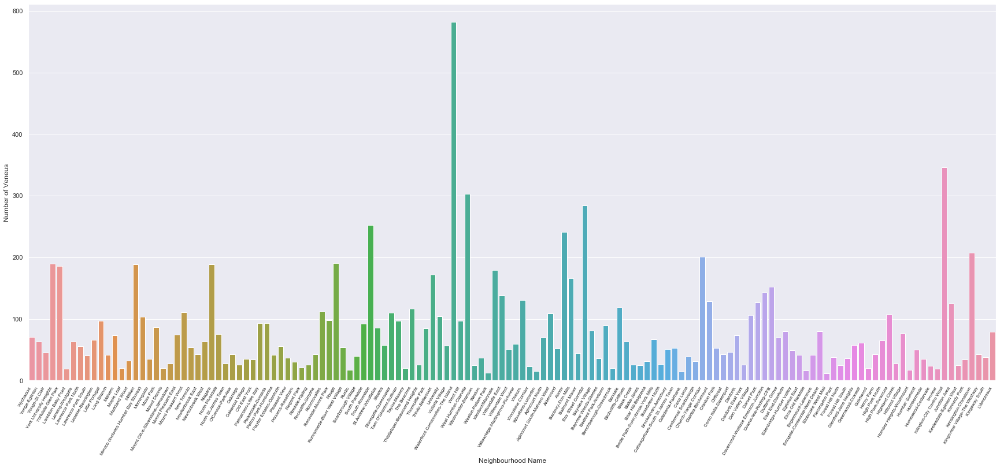

In [22]:
fig = plt.figure(figsize=(30,12)) 
ax = sns.countplot(x="Neighbourhood Name", data=toronto_venues)
ax.set_ylabel('Number of Veneus')
ax.set_xticklabels(ax.get_xticklabels(), rotation=60, ha="right", fontsize=8)
plt.savefig('./output/Venues_counts.png',dpi=200,bbox_inches='tight')

We can see that the Waterfront Communities has the most venues in the neighbourhood, there are totally 8 neighbourhoods that have more than 200 venues. Are those neighbourhoods entertainment districts? Will they be good place to open a Chinese restaurant? We can further analyze the categories of venues in the neighbourhoods, and get a insight into types of the neighbourhoods in the next part.

## Part 3: Types of neighbourhoods <a id='Part_3'></a>

We are going to analyze the categories of venues in each neighbourhood, and investigate the type of individual neighbourhood. We are also going to use the clustering method to group the neighbourhoods and find the similarity between neighbourhoods.

### 3.1 Most categories of venues in the neighbourhoods <a id='Part_3_1'></a>

#### Clean up the categories

Let's firstly take a look at how many categories of venues are there in Toronto, and what they are.

In [23]:
print('There are {} uniques categories.'.format(len(toronto_venues['Venue Category'].unique())))

There are 470 uniques categories.


In [24]:
# print all unique categories
category = toronto_venues['Venue Category'].unique()
category

array(['Bar', 'Bakery', 'Other Repair Shop', 'Gourmet Shop',
       'Italian Restaurant', 'Flower Shop', 'Café', 'Playground',
       'Convenience Store', 'Park', 'Chinese Restaurant',
       'Mexican Restaurant', 'Liquor Store', 'Event Space',
       'Farmers Market', 'Art Gallery', 'Coffee Shop',
       'South American Restaurant', 'Bank', 'Dance Studio',
       'Indian Restaurant', 'BBQ Joint', 'Ice Cream Shop',
       'American Restaurant', 'Jewish Restaurant', 'Restaurant',
       'Burger Joint', 'Sushi Restaurant', 'Fast Food Restaurant',
       'Greek Restaurant', 'Portuguese Restaurant', 'Fish & Chips Shop',
       'Mediterranean Restaurant', 'Filipino Restaurant',
       'Shop & Service', 'Gym / Fitness Center', 'Frozen Yogurt Shop',
       'Food & Drink Shop', 'Caribbean Restaurant', 'Thai Restaurant',
       'Pharmacy', 'Pizza Place', 'Sandwich Place',
       'Latin American Restaurant', 'Jewelry Store', 'Gastropub',
       'Rental Car Location', 'Japanese Restaurant', 'Pers

We can also take a look at how many different types of restaurants in Toronto.

In [25]:
# pull out all types of restaurant
category_restaurants = []
for cate in category:
    if 'Restaurant' in cate:
        category_restaurants.append(cate)
category_restaurants

['Italian Restaurant',
 'Chinese Restaurant',
 'Mexican Restaurant',
 'South American Restaurant',
 'Indian Restaurant',
 'American Restaurant',
 'Jewish Restaurant',
 'Restaurant',
 'Sushi Restaurant',
 'Fast Food Restaurant',
 'Greek Restaurant',
 'Portuguese Restaurant',
 'Mediterranean Restaurant',
 'Filipino Restaurant',
 'Caribbean Restaurant',
 'Thai Restaurant',
 'Latin American Restaurant',
 'Japanese Restaurant',
 'Persian Restaurant',
 'Vietnamese Restaurant',
 'Vegetarian / Vegan Restaurant',
 'Modern European Restaurant',
 'Middle Eastern Restaurant',
 'Eastern European Restaurant',
 'Falafel Restaurant',
 'Asian Restaurant',
 'Seafood Restaurant',
 'Ramen Restaurant',
 'Korean Restaurant',
 'Ethiopian Restaurant',
 'French Restaurant',
 'African Restaurant',
 'Afghan Restaurant',
 'Sri Lankan Restaurant',
 'Dumpling Restaurant',
 'Malay Restaurant',
 'Udon Restaurant',
 'Hong Kong Restaurant',
 'Dim Sum Restaurant',
 'Cantonese Restaurant',
 'Hakka Restaurant',
 'Spanish 

Here is a problem, we see many different types of chinese dishes in the categories, such as Szechuan Restaurant, Shanghai Restaurant, or Tibetan Restaurant, but they are actually all chinese restaurant, so we need to further correct this by adding another columns that converts all types of chinese restaurant into just Chinses Restaurant.

In [26]:
# create a list that contains all types of Chinese restaurant.
chinese_restaurants = ['Chinese Restaurant', 'Dumpling Restaurant', 'Hong Kong Restaurant', 'Dim Sum Restaurant', 
                       'Cantonese Restaurant', 'Tibetan Restaurant', 'Taiwanese Restaurant', 'Xinjiang Restaurant',
                       'Shanghai Restaurant', 'Szechuan Restaurant', 'Hotpot Restaurant']

# define a function to convert all types of chinese restaurant into Chinese Restaurant
def chinese_restaurant_convert(row):
    if row['Venue Category'] in chinese_restaurants:
        return 'Chinese Restaurant'
    return row['Venue Category']

# create a new column in toronto_venues
toronto_venues['Venue Category with chinese corrected'] = toronto_venues.apply (lambda row: chinese_restaurant_convert(row), axis=1)

# check if conversion succeeds
toronto_venues.loc[toronto_venues['Venue Category']=='Xinjiang Restaurant']

,Neighbourhood ID,Neighbourhood Name,Neighbourhood Latitude,Neighbourhood Longitude,Venue ID,Venue Name,Venue Category,Venue Latitude,Venue Longitude,Venue Category with chinese corrected
6023,137,Woburn,43.76674,-79.228586,50a572b1e4b0bf59ea8b91f1,Charcoal Kebab House,Xinjiang Restaurant,43.757348,-79.238842,Chinese Restaurant


We may also need to correct other categories. For example, Café, Coffee Shop, and Cafeteria are the same. In order to reduce the dimensions for clustering, we can also summarize all types of restaurant as just 'Restaurant'.

In [28]:
# define a function to further correct the categories
def category_correct(row):
    if row['Venue Category with chinese corrected']=='Café':
        return 'Coffee Shop'
    if row['Venue Category with chinese corrected']=='Cafeteria':
        return 'Coffee Shop'
    if row['Venue Category with chinese corrected']=='Cafeteria Shop':
        return 'Coffee Shop'
    if 'Restaurant' in row['Venue Category with chinese corrected']:
        return 'Restaurant'
#     if row['Venue Category with chinese corrected']=='Steakhouse':
#         return 'Restaurant'
#     if row['Venue Category with chinese corrected']=='BBQ Joint':
#         return 'Restaurant'
    return row['Venue Category with chinese corrected']

# create a new column in toronto_venues
toronto_venues['Corrected Venue Category'] = toronto_venues.apply (lambda row: category_correct(row), axis=1)

# check if conversion succeeds
toronto_venues.loc[toronto_venues['Venue Category with chinese corrected']=='Café']

,Neighbourhood ID,Neighbourhood Name,Neighbourhood Latitude,Neighbourhood Longitude,Venue ID,Venue Name,Venue Category,Venue Latitude,Venue Longitude,Venue Category with chinese corrected,Corrected Venue Category
6,94,Wychwood,43.676919,-79.425515,562bd5ee498ef6d33064bf1c,The Sovereign,Café,43.674326,-79.433429,Café,Coffee Shop
29,94,Wychwood,43.676919,-79.425515,53553241498ec641e3a6b798,Baker and Scone,Café,43.681614,-79.426075,Café,Coffee Shop
42,94,Wychwood,43.676919,-79.425515,4b6f0c25f964a52060d92ce3,CocoaLatte,Café,43.681768,-79.425158,Café,Coffee Shop
266,27,York University Heights,43.765736,-79.488883,501ff0cae4b035a2215a7094,Buick Pavilion,Café,43.770874,-79.511233,Café,Coffee Shop
302,27,York University Heights,43.765736,-79.488883,4d7e57f487003704f07c6f99,La Prep,Café,43.774168,-79.501889,Café,Coffee Shop
330,27,York University Heights,43.765736,-79.488883,4cd2c3e2df88a35da7bd6aa0,Coffee Time,Café,43.775183,-79.468683,Café,Coffee Shop
397,31,Yorkdale-Glen Park,43.714672,-79.457108,4c20f62eebe52d7f1f6f3178,The Green Umbrella Cafe,Café,43.713595,-79.460805,Café,Coffee Shop
530,31,Yorkdale-Glen Park,43.714672,-79.457108,4fdcca10e4b09473e1965a37,espressamente illy,Café,43.726300,-79.452264,Café,Coffee Shop
575,38,Lansing-Westgate,43.754271,-79.424748,55185ce5498edc65f56541bd,Aroma Espresso Bar,Café,43.738399,-79.434194,Café,Coffee Shop
659,105,Lawrence Park North,43.730060,-79.403978,529f7dd2498e96adf4bc4e66,Aroma Espresso Bar,Café,43.731193,-79.403678,Café,Coffee Shop


#### Calculate the frequency of categories in each neighbourhood

Then we can summarize the venues in each neighbourhood based on the categories and take a look at the most popular catetory of venues in the neighbourhood.

In [29]:
# one hot encoding
toronto_onehot = pd.get_dummies(toronto_venues[['Corrected Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
toronto_onehot['Neighbourhood Name'] = toronto_venues['Neighbourhood Name'] 

# move neighborhood column to the first column
toronto_onehot = toronto_onehot.reindex(columns=(['Neighbourhood Name'] + list([icol for icol in toronto_onehot.columns if icol != 'Neighbourhood Name']) ))

# group by each neighbourhood and calculate the frequency of each category
toronto_grouped = toronto_onehot.groupby('Neighbourhood Name').mean().reset_index()
toronto_grouped

,Neighbourhood Name,Accessories Store,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Astrologer,Athletics & Sports,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Badminton Court,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Camera Store,Campground,Candy Store,Carpet Store,Casino,Castle,Cemetery,Cheese Shop,Child Care Service,Chiropractor,Chocolate Shop,Church,Churrascaria,Circus,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Auditorium,College Cafeteria,College Gym,College Quad,College Rec Center,College Stadium,College Theater,Comedy Club,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cupcake Shop,Curling Ice,Cycle Studio,Dance Studio,Deli / Bodega,Dentist's Office,Department Store,Design Studio,Dessert Shop,Diner,Disc Golf,Discount Store,Distribution Center,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Electronics Store,Elementary School,Entertainment Service,Escape Room,Event Service,Event Space,Exhibit,Fabric Shop,Factory,Farm,Farmers Market,Field,Financial or Legal Service,Fireworks Store,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Forest,Fountain,Frame Store,Fraternity House,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,Gift Shop,Golf Course,Golf Driving Range,Gourmet Shop,Government Building,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,High School,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hockey Field,Hockey Rink,Home Service,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotel Pool,Housing Development,IT Services,Ice Cream Shop,Indie Movie Theater,Indie Theater,Indoor Play Area,Insurance Office,Intersection,Irish Pub,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Lake,Laser Tag,Laundromat,Laundry Service,Lawyer,Leather Goods Store,Library,Light Rail Station,Lighthouse,Lighting Store,Lingerie Store,Liquor Store,Locksmith,Lounge,Luggage Store,Marijuana Dispensary,Market,Martial Arts School,Massage Studio,Mattress Store,Medical Center,Medical Supply Store,Men's Store,Metro Station,Miscellaneous Shop,Mobile Phone Shop,Monument / Landmark,Motel,Motorcycle Shop,Mountain,Movie Theater,Moving Target,Museum,Music School,Music Store,Music Venue,Nail Salon,National Park,Nature Preserve,Neighborhood,Night Market,Nightclub,Nightlife Spot,Noodle House,Nudist Beach,Office,Optical Shop,Organic Grocery,Other Great Outdoors,Other Repair Shop,Outdoor Sculpture,Outdoor Supply Store,Outdoors & Recreation,Paintball Field,Paper / Office Supplies Store,Park,Pastry Shop,Pawn Shop,Performing Arts Venue,Pet Service,Pet Store,Pharmacy,Photography Lab,Photography Studio,Physical Therapist,Piano Bar,Pide Place,Pie Shop,Pier,Pilates Studio,Pizza Place,Plane,Platform,Playground,Plaza,Poke Place,Pool,Pool Hall,Post Office,Poutine Place,Print Shop,Pub,Public Art,Racecourse,Racetrack,Record Shop,Recording Studio,Recreation Center,Rental Car Location,Rental Service,Reservoir,Residential Building (Apartment / Condo),Resort,Rest Area,Restaurant,River,

In [30]:
# check the shape of new dataframe
toronto_grouped.shape

(140, 387)

Great, we reduece the size of categories from 470 to 385!

#### Top 10 most common venues in each neighborhood

In [31]:
# Create a function to sort the venues in descending order.
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Sort venues in each neighborhood and merge top 10 common venues into new dataframe

In [32]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighbourhood Name']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
toronto_neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
toronto_neighborhoods_venues_sorted['Neighbourhood Name'] = toronto_grouped['Neighbourhood Name']

for ind in np.arange(toronto_grouped.shape[0]):
    toronto_neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(toronto_grouped.iloc[ind, :], num_top_venues)

toronto_neighborhoods_venues_sorted

,Neighbourhood Name,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Agincourt North,Restaurant,Sandwich Place,Pizza Place,Bakery,Shopping Mall,Pharmacy,Bank,Park,Grocery Store,Coffee Shop
1,Agincourt South-Malvern West,Restaurant,Shopping Mall,Park,Coffee Shop,Gym / Fitness Center,Rental Car Location,Pizza Place,Diner,Construction & Landscaping,Pharmacy
2,Alderwood,Park,Trail,Convenience Store,Gas Station,Pizza Place,Intersection,Health & Beauty Service,Restaurant,Discount Store,Coffee Shop
3,Annex,Restaurant,Coffee Shop,Spa,Pizza Place,Grocery Store,Sandwich Place,Ice Cream Shop,Boutique,Park,Pub
4,Banbury-Don Mills,Restaurant,Coffee Shop,Park,Gym,Intersection,Pizza Place,Sandwich Place,Bank,Supermarket,Burger Joint
5,Bathurst Manor,Restaurant,Bank,Park,Convenience Store,Shopping Mall,Coffee Shop,Pharmacy,Deli / Bodega,Men's Store,Nightclub
6,Bay Street Corridor,Restaurant,Coffee Shop,Clothing Store,Deli / Bodega,Tea Room,Hotel,Salad Place,Sandwich Place,Burger Joint,Bank
7,Bayview Village,Restaurant,Coffee Shop,Park,Furniture / Home Store,Metro Station,Shoe Store,Pharmacy,Clothing Store,Trail,Tennis Court
8,Bayview Woods-Steeles,Park,Restaurant,Coffee Shop,Intersection,Bank,Grocery Store,Gas Station,Basketball Court,Dog Run,Liquor Store
9,Bedford Park-Nortown,Restaurant,Coffee Shop,Pharmacy,Pet Store,Sandwich Place,Pizza Place,Convenience Store,Bagel Shop,Park,Bakery


### 3.2 Similarity between neighbourhoods: Clustering <a id='Part_3_2'></a>

Use kmeans algorithm to cluster the nerghborhood into 5 clusters.

In [33]:
# set number of clusters
kclusters = 4

toronto_grouped_clustering = toronto_grouped.drop('Neighbourhood Name', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(toronto_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_ 

array([1, 3, 2, 1, 1, 0, 1, 0, 2, 1, 0, 0, 2, 0, 0, 0, 2, 0, 1, 1, 2, 2,
       2, 1, 0, 0, 2, 3, 1, 2, 0, 1, 1, 0, 1, 0, 0, 3, 0, 2, 0, 2, 1, 0,
       0, 0, 1, 2, 1, 0, 0, 2, 1, 2, 0, 1, 2, 0, 0, 1, 0, 0, 1, 2, 1, 0,
       2, 1, 1, 0, 0, 1, 1, 0, 2, 2, 3, 2, 2, 1, 1, 0, 1, 1, 1, 1, 1, 0,
       3, 2, 2, 0, 1, 1, 3, 0, 0, 1, 0, 2, 2, 1, 0, 1, 2, 2, 1, 0, 0, 0,
       0, 2, 3, 0, 3, 2, 0, 3, 0, 1, 1, 1, 1, 0, 1, 2, 2, 3, 0, 1, 3, 2,
       0, 0, 2, 3, 1, 3, 1, 0], dtype=int32)

Let's plot the results on the map.

In [34]:
# add clustering labels
toronto_venues_cluster = toronto_neighborhoods_venues_sorted.copy()
toronto_venues_cluster.insert(0, 'Cluster Labels', kmeans.labels_)

toronto_merged = toronto_neighbours.copy()
def change_name(row):
    return " ".join(row['AREA_NAME'].split()[:-1])
toronto_merged['Neighbourhood Name'] = toronto_merged.apply (lambda row: change_name(row), axis=1)

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
toronto_merged = toronto_merged.join(toronto_venues_cluster.set_index('Neighbourhood Name'), on='Neighbourhood Name', how='inner')

toronto_merged

,_id,AREA_ID,AREA_ATTR_ID,PARENT_AREA_ID,AREA_SHORT_CODE,AREA_LONG_CODE,AREA_NAME,AREA_DESC,X,Y,LONGITUDE,LATITUDE,OBJECTID,Shape__Area,Shape__Length,geometry,Neighbourhood Name,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,7281,25886861,25926662,49885,94,94,Wychwood (94),Wychwood (94),None,None,-79.425515,43.676919,16491505,3.217960e+06,7515.779658,"POLYGON ((-79.43592 43.68015, -79.43492 43.680...",Wychwood,3,Restaurant,Coffee Shop,Ice Cream Shop,Bakery,Park,Convenience Store,Burger Joint,Pizza Place,Gourmet Shop,Bank
1,7282,25886820,25926663,49885,100,100,Yonge-Eglinton (100),Yonge-Eglinton (100),None,None,-79.403590,43.704689,16491521,3.160334e+06,7872.021074,"POLYGON ((-79.41096 43.70408, -79.40962 43.704...",Yonge-Eglinton,1,Restaurant,Coffee Shop,Park,Bank,Gym,Clothing Store,Liquor Store,Sandwich Place,Burger Joint,Bar
2,7283,25886834,25926664,49885,97,97,Yonge-St.Clair (97),Yonge-St.Clair (97),None,None,-79.397871,43.687859,16491537,2.222464e+06,8130.411276,"POLYGON ((-79.39119 43.68108, -79.39141 43.680...",Yonge-St.Clair,3,Restaurant,Shoe Store,Spa,Coffee Shop,Fried Chicken Joint,Chiropractor,Bank,Bakery,Bagel Shop,Park
3,7284,25886593,25926665,49885,27,27,York University Heights (27),York University Heights (27),None,None,-79.488883,43.765736,16491553,2.541821e+07,25632.335242,"POLYGON ((-79.50529 43.75987, -79.50488 43.759...",York University Heights,1,Restaurant,Coffee Shop,Furniture / Home Store,Grocery Store,Sandwich Place,Pizza Place,Park,Skating Rink,Sports Bar,Breakfast Spot
4,7285,25886688,25926666,49885,31,31,Yorkdale-Glen Park (31),Yorkdale-Glen Park (31),None,None,-79.457108,43.714672,16491569,1.156669e+07,13953.408098,"POLYGON ((-79.43969 43.70561, -79.44011 43.705...",Yorkdale-Glen Park,0,Restaurant,Clothing Store,Furniture / Home Store,Coffee Shop,Accessories Store,Grocery Store,Women's Store,Pizza Place,Dessert Shop,Cosmetics Shop
5,7286,25886404,25926667,49885,114,114,Lambton Baby Point (114),Lambton Baby Point (114),None,None,-79.496045,43.657420,16491585,3.406857e+06,11181.788316,"POLYGON ((-79.50552 43.66281, -79.50577 43.662...",Lambton Baby Point,2,Park,Restaurant,Outdoors & Recreation,Coffee Shop,Tennis Court,Taco Place,River,Trail,School,Skating Rink
6,7287,25886627,25926668,49885,38,38,Lansing-Westgate (38),Lansing-Westgate (38),None,None,-79.424748,43.754271,16491601,1.025436e+07,15391.584157,"POLYGON ((-79.43998 43.76156, -79.44004 43.761...",Lansing-Westgate,1,Restaurant,Coffee Shop,Home Service,Park,Pharmacy,Gas Station,Bakery,Playground,Pizza Place,Pool
7,7288,25886808,25926669,49885,105,105,Lawrence Park North (105),Lawrence Park North (105),None,None,-79.403978,43.730060,16491617,4.388577e+06,9051.488042,"POLYGON ((-79.39008 43.72768, -79.39199 43.727...",Lawrence Park North,1,Restaurant,Bakery,Coffee Shop,Sandwich Place,Pizza Place,Bank,Shoe Store,Pharmacy,Pub,Frozen Yogurt Shop
8,7289,25886812,25926670,49885,103,103,Lawrence Park South (103),Lawrence Park South (103),None,None,-79.406039,43.717212,16491633,6.211341e+06,13530.370002,"POLYGON ((-79.41096 43.70408, -79.41165 43.703...",Lawrence Park South,0,Coffee Shop,Restaurant,Park,Bagel Shop,Garden,Music Venue,Bakery,Bank,Gastropub,Lingerie Store
9,7290,25886328,25926671,49885,56,56,Leaside-Bennington (56),Leaside-Bennington (56),None,None,-79.366072,43.703797,16491649,9.161864e+06,20531.730658,"POLYGON ((-79.37749 43.71309, -79.37762 43.713...",Leaside-Bennington,0,Restaurant,Coffee Shop,Pizza Place,Park,Rental Service,Bank,Sports Bar,Sporting Goods Shop,Skating Rink,Trail


In [35]:
# Create the open street map from Folium
center_location = [toronto_neighbours['LATITUDE'].mean(), toronto_neighbours['LONGITUDE'].mean()]
open_street_map = folium.Map(name='GTA regions', location=center_location, zoom_start=11, width='100%', height='100%')

# Create a GeoJson layer of the Toronto neighbourhoods to be added to the open street map
toronto_neighbours_layer = folium.Choropleth(
    geo_data=toronto_merged,
    name='Toronto neighborhoods',
    data=toronto_merged,
    columns=['Neighbourhood Name', 'Cluster Labels'],
    key_on='feature.properties.Neighbourhood Name',
    fill_color='Spectral',
    fill_opacity=0.7,
    line_opacity=0.5,
    legend_name='Cluster',
    bins=kclusters,
    reset=True
).add_to(open_street_map)

# Add the name and id of each neighbourhood
for lat, lon, name in zip(toronto_neighbours['LATITUDE'],toronto_neighbours['LONGITUDE'],toronto_neighbours['AREA_NAME']):
    folium.Circle(location=[lat,lon],
                  radius=30,
                  fill=False,
                  color='black',
                  tooltip=name,
                  ).add_to(open_street_map)


folium.LayerControl().add_to(open_street_map)


# open_street_map.save('./output/boundaries_of_Toronto_neighbourhoods.html')
open_street_map

/Users/harryliyi/opt/anaconda3/envs/py37/lib/python3.7/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


Merge the cluster label with top 10 most common venues for all neighborhoods.

In [264]:
# add clustering labels
toronto_venues_cluster = toronto_neighborhoods_venues_sorted.copy()
toronto_venues_cluster.insert(0, 'Cluster Labels', kmeans.labels_)

toronto_venues_cluster

,Cluster Labels,Neighbourhood Name,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,1,Agincourt North,Restaurant,Sandwich Place,Pizza Place,Bakery,Shopping Mall,Pharmacy,Bank,Park,Grocery Store,Coffee Shop
1,3,Agincourt South-Malvern West,Restaurant,Shopping Mall,Park,Coffee Shop,Gym / Fitness Center,Rental Car Location,Pizza Place,Diner,Construction & Landscaping,Pharmacy
2,2,Alderwood,Park,Trail,Convenience Store,Gas Station,Pizza Place,Intersection,Health & Beauty Service,Restaurant,Discount Store,Coffee Shop
3,1,Annex,Restaurant,Coffee Shop,Spa,Pizza Place,Grocery Store,Sandwich Place,Ice Cream Shop,Boutique,Park,Pub
4,1,Banbury-Don Mills,Restaurant,Coffee Shop,Park,Gym,Intersection,Pizza Place,Sandwich Place,Bank,Supermarket,Burger Joint
5,0,Bathurst Manor,Restaurant,Bank,Park,Convenience Store,Shopping Mall,Coffee Shop,Pharmacy,Deli / Bodega,Men's Store,Nightclub
6,1,Bay Street Corridor,Restaurant,Coffee Shop,Clothing Store,Deli / Bodega,Tea Room,Hotel,Salad Place,Sandwich Place,Burger Joint,Bank
7,0,Bayview Village,Restaurant,Coffee Shop,Park,Furniture / Home Store,Metro Station,Shoe Store,Pharmacy,Clothing Store,Trail,Tennis Court
8,2,Bayview Woods-Steeles,Park,Restaurant,Coffee Shop,Intersection,Bank,Grocery Store,Gas Station,Basketball Court,Dog Run,Liquor Store
9,1,Bedford Park-Nortown,Restaurant,Coffee Shop,Pharmacy,Pet Store,Sandwich Place,Pizza Place,Convenience Store,Bagel Shop,Park,Bakery


#### Cluster 1

In [265]:
toronto_venues_cluster.loc[toronto_venues_cluster['Cluster Labels'] == 0, toronto_venues_cluster.columns[list(range(1, toronto_venues_cluster.shape[1]))]]

,Neighbourhood Name,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
5,Bathurst Manor,Restaurant,Bank,Park,Convenience Store,Shopping Mall,Coffee Shop,Pharmacy,Deli / Bodega,Men's Store,Nightclub
7,Bayview Village,Restaurant,Coffee Shop,Park,Furniture / Home Store,Metro Station,Shoe Store,Pharmacy,Clothing Store,Trail,Tennis Court
10,Beechborough-Greenbrook,Restaurant,Furniture / Home Store,Discount Store,Convenience Store,Video Store,Business Service,Spa,Grocery Store,Auto Garage,Dessert Shop
11,Bendale,Restaurant,Coffee Shop,Clothing Store,Pizza Place,Furniture / Home Store,Bank,Park,Sandwich Place,Department Store,Bakery
13,Black Creek,Hotel,Restaurant,Grocery Store,Shopping Mall,Intersection,Pharmacy,Athletics & Sports,Discount Store,Liquor Store,Gym / Fitness Center
14,Blake-Jones,Restaurant,Park,Burger Joint,Discount Store,Beer Store,Toy / Game Store,Donut Shop,Athletics & Sports,Beer Bar,Coffee Shop
15,Briar Hill-Belgravia,Restaurant,Furniture / Home Store,Coffee Shop,Sandwich Place,Pizza Place,Men's Store,Gym Pool,Trail,Pharmacy,Grocery Store
17,Broadview North,Restaurant,Park,Pizza Place,Pharmacy,Bus Stop,Bus Station,Bakery,Theater,Pastry Shop,Grocery Store
24,Clairlea-Birchmount,Restaurant,Sandwich Place,Coffee Shop,Intersection,Convenience Store,Pizza Place,Bus Station,Sporting Goods Shop,Bakery,Hardware Store
25,Clanton Park,Restaurant,Coffee Shop,Park,Beer Store,Sandwich Place,Gas Station,Pizza Place,Locksmith,Pharmacy,IT Services


#### Cluster 2

In [267]:
toronto_venues_cluster.loc[toronto_venues_cluster['Cluster Labels'] == 1, toronto_venues_cluster.columns[list(range(1, toronto_venues_cluster.shape[1]))]]

,Neighbourhood Name,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Agincourt North,Restaurant,Sandwich Place,Pizza Place,Bakery,Shopping Mall,Pharmacy,Bank,Park,Grocery Store,Coffee Shop
3,Annex,Restaurant,Coffee Shop,Spa,Pizza Place,Grocery Store,Sandwich Place,Ice Cream Shop,Boutique,Park,Pub
4,Banbury-Don Mills,Restaurant,Coffee Shop,Park,Gym,Intersection,Pizza Place,Sandwich Place,Bank,Supermarket,Burger Joint
6,Bay Street Corridor,Restaurant,Coffee Shop,Clothing Store,Deli / Bodega,Tea Room,Hotel,Salad Place,Sandwich Place,Burger Joint,Bank
9,Bedford Park-Nortown,Restaurant,Coffee Shop,Pharmacy,Pet Store,Sandwich Place,Pizza Place,Convenience Store,Bagel Shop,Park,Bakery
18,Brookhaven-Amesbury,Restaurant,Coffee Shop,Pizza Place,Grocery Store,Bakery,Construction & Landscaping,Sandwich Place,Supermarket,Gym / Fitness Center,Liquor Store
19,Cabbagetown-South St.James Town,Restaurant,Coffee Shop,Park,Pizza Place,Diner,Bakery,Market,Butcher,Nightclub,Beer Store
23,Church-Yonge Corridor,Restaurant,Coffee Shop,Hotel,Sandwich Place,Gay Bar,Clothing Store,Gastropub,Pub,Gym,Theater
28,Danforth,Restaurant,Coffee Shop,Pizza Place,Gastropub,Bar,Beer Bar,Breakfast Spot,Bakery,Bank,Dessert Shop
31,Dorset Park,Restaurant,Coffee Shop,Furniture / Home Store,Electronics Store,Sandwich Place,Breakfast Spot,Gym,Park,Light Rail Station,Bakery


#### Cluster 3

In [268]:
toronto_venues_cluster.loc[toronto_venues_cluster['Cluster Labels'] == 2, toronto_venues_cluster.columns[list(range(1, toronto_venues_cluster.shape[1]))]]

,Neighbourhood Name,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
2,Alderwood,Park,Trail,Convenience Store,Gas Station,Pizza Place,Intersection,Health & Beauty Service,Restaurant,Discount Store,Coffee Shop
8,Bayview Woods-Steeles,Park,Restaurant,Coffee Shop,Intersection,Bank,Grocery Store,Gas Station,Basketball Court,Dog Run,Liquor Store
12,Birchcliffe-Cliffside,Park,Coffee Shop,Restaurant,Pizza Place,Beach,Pub,Diner,Convenience Store,Grocery Store,Gastropub
16,Bridle Path-Sunnybrook-York Mills,Coffee Shop,Restaurant,Park,Business Service,Grocery Store,Dog Run,Golf Course,Bus Line,Trail,Food Court
20,Caledonia-Fairbank,Park,Cosmetics Shop,Women's Store,Sporting Goods Shop,Construction & Landscaping,Playground,Restaurant,Bakery,Pharmacy,Spa
21,Casa Loma,Park,Restaurant,History Museum,Museum,Playground,Coffee Shop,Dessert Shop,Historic Site,Garden Center,Paper / Office Supplies Store
22,Centennial Scarborough,Park,Bar,Restaurant,Sandwich Place,Coffee Shop,Fish & Chips Shop,Dog Run,Liquor Store,Martial Arts School,Pet Store
26,Cliffcrest,Park,Restaurant,Harbor / Marina,Pizza Place,Discount Store,Pharmacy,Ice Cream Shop,Beach,Construction & Landscaping,Sandwich Place
29,Danforth East York,Coffee Shop,Park,Restaurant,Convenience Store,Bus Line,Bank,Bakery,Gay Bar,BBQ Joint,Sandwich Place
39,Englemount-Lawrence,Park,Restaurant,Coffee Shop,Playground,Shoe Store,Bank,Department Store,Supermarket,Electronics Store,Liquor Store


#### Cluster 4

In [269]:
toronto_venues_cluster.loc[toronto_venues_cluster['Cluster Labels'] == 3, toronto_venues_cluster.columns[list(range(1, toronto_venues_cluster.shape[1]))]]

,Neighbourhood Name,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1,Agincourt South-Malvern West,Restaurant,Shopping Mall,Park,Coffee Shop,Gym / Fitness Center,Rental Car Location,Pizza Place,Diner,Construction & Landscaping,Pharmacy
27,Corso Italia-Davenport,Restaurant,Coffee Shop,Bakery,Breakfast Spot,Convenience Store,Smoke Shop,Bus Stop,Pizza Place,Lounge,Pet Store
37,Eglinton East,Restaurant,Grocery Store,Pizza Place,Pharmacy,Coffee Shop,Ice Cream Shop,Sandwich Place,Playground,Spa,Bowling Alley
76,Milliken,Restaurant,Coffee Shop,Pharmacy,Bakery,Grocery Store,Park,Dessert Shop,Bubble Tea Shop,Shopping Mall,Noodle House
88,North Riverdale,Restaurant,Coffee Shop,Pub,Grocery Store,Bar,Park,Frozen Yogurt Shop,Fried Chicken Joint,Churrascaria,Dog Run
94,Palmerston-Little Italy,Restaurant,Coffee Shop,Bakery,Bar,Sandwich Place,Park,Karaoke Bar,Comedy Club,Salon / Barbershop,Grocery Store
112,Steeles,Restaurant,Park,Pizza Place,Intersection,Baseball Field,Bakery,Spa,Tree,Supermarket,Tattoo Parlor
114,Tam O'Shanter-Sullivan,Restaurant,Park,Coffee Shop,Pizza Place,Bank,Grocery Store,Sandwich Place,Pharmacy,Shopping Mall,Spa
117,Thistletown-Beaumond Heights,Restaurant,Park,Moving Target,Construction & Landscaping,Pharmacy,Coffee Shop,Supermarket,Electronics Store,Skating Rink,Art Gallery
127,Weston-Pellam Park,Restaurant,Park,Snack Place,Jewelry Store,Pizza Place,Art Gallery,Fish Market,Fireworks Store,Fabric Shop,Dry Cleaner
